## Cognifyz Data Analysis

In [1]:
import pandas as pd
import folium
import matplotlib.pyplot as plt

df = pd.read_csv('Dataset .csv', low_memory=False)
print(df.head(4))

   Restaurant ID         Restaurant Name  Country Code              City  \
0      6317637.0        Le Petit Souffle         162.0       Makati City   
1      6304287.0        Izakaya Kikufuji         162.0       Makati City   
2      6300002.0  Heat - Edsa Shangri-La         162.0  Mandaluyong City   
3      6318506.0                    Ooma         162.0  Mandaluyong City   

                                             Address  \
0  Third Floor, Century City Mall, Kalayaan Avenu...   
1  Little Tokyo, 2277 Chino Roces Avenue, Legaspi...   
2  Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...   
3  Third Floor, Mega Fashion Hall, SM Megamall, O...   

                                     Locality  \
0   Century City Mall, Poblacion, Makati City   
1  Little Tokyo, Legaspi Village, Makati City   
2  Edsa Shangri-La, Ortigas, Mandaluyong City   
3      SM Megamall, Ortigas, Mandaluyong City   

                                    Locality Verbose   Longitude   Latitude  \
0  Century Ci

#### Data Collections

In [2]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1048575 entries, 0 to 1048574
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   float64
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   float64
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   float64
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order

In [3]:
df.describe()

,Restaurant ID,Country Code,Longitude,Latitude,Average Cost for two,Price range,Aggregate rating,Votes
count,9.551000e+03,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9552.000000,9551.000000
mean,9.051128e+06,18.365616,64.126574,25.854381,1199.210763,1.804837,3.665986,156.909748
std,8.791521e+06,56.750546,41.467058,11.007935,16121.183073,0.905609,97.708586,430.169145
min,5.300000e+01,1.000000,-157.948486,-41.330428,0.000000,1.000000,0.000000,0.000000
25%,3.019625e+05,1.000000,77.081343,28.478713,250.000000,1.000000,2.500000,5.000000
50%,6.004089e+06,1.000000,77.191964,28.570469,400.000000,2.000000,3.200000,31.000000
75%,1.835229e+07,1.000000,77.282006,28.642758,700.000000,2.000000,3.700000,131.000000
max,1.850065e+07,216.000000,174.832089,55.976980,800000.000000,4.000000,9551.000000,10934.000000


In [4]:
df.notnull().sum()

Restaurant ID           9551
Restaurant Name         9551
Country Code            9551
City                    9551
Address                 9551
Locality                9551
Locality Verbose        9551
Longitude               9551
Latitude                9551
Cuisines                9542
Average Cost for two    9551
Currency                9551
Has Table booking       9551
Has Online delivery     9551
Is delivering now       9551
Switch to order menu    9551
Price range             9551
Aggregate rating        9552
Rating color            9551
Rating text             9551
Votes                   9551
dtype: int64

In [5]:
df = df.dropna()
df

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637.0,Le Petit Souffle,162.0,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3.0,4.8,Dark Green,Excellent,314.0
1,6304287.0,Izakaya Kikufuji,162.0,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3.0,4.5,Dark Green,Excellent,591.0
2,6300002.0,Heat - Edsa Shangri-La,162.0,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4.0,4.4,Green,Very Good,270.0
3,6318506.0,Ooma,162.0,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4.0,4.9,Dark Green,Excellent,365.0
4,6314302.0,Sambo Kojin,162.0,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4.0,4.8,Dark Green,Excellent,229.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730.0,Naml۱ Gurme,208.0,��stanbul,"Kemanke�� Karamustafa Pa��a Mahallesi, R۱ht۱m ...",Karak�_y,"Karak�_y, ��stanbul",28.977392,41.022793,Turkish,...,Turkish Lira(TL),No,No,No,No,3.0,4.1,Green,Very Good,788.0
9547,5908749.0,Ceviz A��ac۱,208.0,��stanbul,"Ko��uyolu Mahallesi, Muhittin ��st�_nda�� Cadd...",Ko��uyolu,"Ko��uyolu, ��stanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",...,Turkish Lira(TL),No,No,No,No,3.0,4.2,Green,Very Good,1034.0
9548,5915807.0,Huqqa,208.0,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.034640,41.055817,"Italian, World Cuisine",...,Turkish Lira(TL),No,No,No,No,4.0,3.7,Yellow,Good,661.0
9549,5916112.0,A���k Kahve,208.0,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.036019,41.057979,Restaurant Cafe,...,Turkish Lira(TL),No,No,No,No,4.0,4.0,Green,Very Good,901.0


In [6]:
df = df.dropna()
df2 = df.copy()
df = df.drop_duplicates()
df

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637.0,Le Petit Souffle,162.0,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3.0,4.8,Dark Green,Excellent,314.0
1,6304287.0,Izakaya Kikufuji,162.0,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3.0,4.5,Dark Green,Excellent,591.0
2,6300002.0,Heat - Edsa Shangri-La,162.0,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4.0,4.4,Green,Very Good,270.0
3,6318506.0,Ooma,162.0,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4.0,4.9,Dark Green,Excellent,365.0
4,6314302.0,Sambo Kojin,162.0,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4.0,4.8,Dark Green,Excellent,229.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730.0,Naml۱ Gurme,208.0,��stanbul,"Kemanke�� Karamustafa Pa��a Mahallesi, R۱ht۱m ...",Karak�_y,"Karak�_y, ��stanbul",28.977392,41.022793,Turkish,...,Turkish Lira(TL),No,No,No,No,3.0,4.1,Green,Very Good,788.0
9547,5908749.0,Ceviz A��ac۱,208.0,��stanbul,"Ko��uyolu Mahallesi, Muhittin ��st�_nda�� Cadd...",Ko��uyolu,"Ko��uyolu, ��stanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",...,Turkish Lira(TL),No,No,No,No,3.0,4.2,Green,Very Good,1034.0
9548,5915807.0,Huqqa,208.0,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.034640,41.055817,"Italian, World Cuisine",...,Turkish Lira(TL),No,No,No,No,4.0,3.7,Yellow,Good,661.0
9549,5916112.0,A���k Kahve,208.0,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.036019,41.057979,Restaurant Cafe,...,Turkish Lira(TL),No,No,No,No,4.0,4.0,Green,Very Good,901.0


## Level 2

### Task 1 : Top Cuisines

In [7]:
agg_rating = df["Aggregate rating"].value_counts().sort_values(ascending=False)
agg_rating = agg_rating.drop(agg_rating.index[0])
agg_rating

Aggregate rating
3.2    522
3.1    519
3.4    495
3.3    483
3.5    480
3.0    468
3.6    458
3.7    427
3.8    399
2.9    381
3.9    332
2.8    315
4.1    274
4.0    266
2.7    250
4.2    221
2.6    191
4.3    174
4.4    143
2.5    110
4.5     95
2.4     87
4.6     78
4.9     61
2.3     47
4.7     41
2.2     27
4.8     25
2.1     15
2.0      7
1.9      2
1.8      1
Name: count, dtype: int64

In [8]:
print("Most common aggregate rating range :", agg_rating.index[1], " - ", agg_rating.index[4])
print("Most common aggregate rating : ", agg_rating.index[0])

Most common aggregate rating range : 3.1  -  3.5
Most common aggregate rating :  3.2


In [9]:
top5 = agg_rating.head(5)
top5

Aggregate rating
3.2    522
3.1    519
3.4    495
3.3    483
3.5    480
Name: count, dtype: int64

In [10]:
avg_votes = df["Votes"].mean()
print("Average number of Votes received by restaurants : ", round(avg_votes))

Average number of Votes received by restaurants :  157


### Task 2 : Cuisine Combination

In [11]:
# df["Cuisines"] = df["Cuisines"].str.strip()
df["Cuisines"] = df["Cuisines"].str.split(",")
df = df.explode("Cuisines")
df["Cuisines"] = df["Cuisines"].str.strip()
df["Cuisines"].value_counts()

Cuisines
North Indian      3960
Chinese           2735
Fast Food         1986
Mughlai            995
Italian            764
                  ... 
Cuisine Varies       1
Fish and Chips       1
Durban               1
D�_ner               1
B�_rek               1
Name: count, Length: 145, dtype: int64

In [12]:
print("The most common combinations of cuisines : ", df["Cuisines"].value_counts().index[0])

The most common combinations of cuisines :  North Indian


In [13]:
cuisine_ratings = df.groupby("Cuisines")["Aggregate rating"].mean().sort_values(ascending=False)
cuisine_ratings.head(5)

Cuisines
Sunda        4.900000
B�_rek       4.700000
Taiwanese    4.650000
Ramen        4.500000
Dim Sum      4.466667
Name: Aggregate rating, dtype: float64

In [14]:
print("Cuisine combination that tend to have higher rating :", cuisine_ratings.index[0])

Cuisine combination that tend to have higher rating : Sunda


### Task 3 : Geographic Analysis

In [15]:
m = folium.Map(location=[df2["Latitude"].mean(), df2["Longitude"].mean()],zoom_start=3)
for _, row in df.iterrows():
    color = "green" if row["Aggregate rating"] >= 4 else "red"
    folium.CircleMarker(
        location=[row["Latitude"], row["Longitude"]],
        radius=5,
        color=color,
        fill=True
    ).add_to(m)
m

In [16]:
df2["Country Code"].value_counts()

Country Code
1.0      8652
216.0     425
215.0      80
30.0       60
189.0      60
214.0      60
148.0      40
208.0      34
14.0       24
162.0      22
94.0       21
166.0      20
184.0      20
191.0      20
37.0        4
Name: count, dtype: int64

In [17]:
print("India has highest number of cuisines")

India has highest number of cuisines


### Task 4 : Restaurant Chains

In [18]:
chain_counts = df2['Restaurant Name'].value_counts()
restaurant_chains = chain_counts[chain_counts > 1]
print("Restaurant Chains :")
print()
restaurant_chains

Restaurant Chains :



Restaurant Name
Cafe Coffee Day     83
Domino's Pizza      79
Subway              63
Green Chick Chop    51
McDonald's          48
                    ..
Gymkhana             2
Dishoom              2
Timboo Cafe          2
Silantro Fil-Mex     2
D�_vero��lu          2
Name: count, Length: 734, dtype: int64

In [19]:
chains_df = df2[df2['Restaurant Name'].isin(restaurant_chains.index)]
chain_analysis = (chains_df.groupby('Restaurant Name').agg(
        outlets=('Restaurant ID', 'count'),
        avg_rating=('Aggregate rating', 'mean'),
        total_votes=('Votes', 'sum')
    ).sort_values(by='outlets', ascending=False)
)
chain_analysis

,outlets,avg_rating,total_votes
Restaurant Name,,,
Cafe Coffee Day,83,2.419277,2428.0
Domino's Pizza,79,2.740506,6643.0
Subway,63,2.907937,6124.0
Green Chick Chop,51,2.672549,964.0
McDonald's,48,3.339583,5291.0
...,...,...,...
Truffles,2,3.950000,9682.0
Twigly,2,4.550000,471.0
Twisted Tacos,2,3.600000,242.0


## Level 1

### Task 1: Top Cuisines

In [20]:
df3 = df2.copy
top3 = df['Cuisines'].value_counts()
print("Top three most common cuisines in the dataset : ")
print()
top3.head(3)

Top three most common cuisines in the dataset : 



Cuisines
North Indian    3960
Chinese         2735
Fast Food       1986
Name: count, dtype: int64

In [21]:
total_count = df2['Restaurant ID'].value_counts().sum()
print("Total number of restaurants : ", total_count)
print("Percentage of restaurants of " + top3.index[0] + " cuisines : ", round(top3.values[0]/total_count * 100,2), "%")
print("Percentage of restaurants of " + top3.index[1] + " cuisines : ", round(top3.values[1]/total_count * 100,2), "%")
print("Percentage of restaurants of " + top3.index[2] + " cuisines : ", round(top3.values[2]/total_count * 100,2), "%")

Total number of restaurants :  9542
Percentage of restaurants of North Indian cuisines :  41.5 %
Percentage of restaurants of Chinese cuisines :  28.66 %
Percentage of restaurants of Fast Food cuisines :  20.81 %


### Task 2 : City Analysis

In [22]:
topCity = df2['City'].value_counts()
topCity

City
New Delhi    5473
Gurgaon      1118
Noida        1080
Faridabad     251
Ghaziabad      25
             ... 
Inverloch       1
Mohali          1
Panchkula       1
Bandung         1
Randburg        1
Name: count, Length: 140, dtype: int64

In [23]:
print("City with highest number of restaurants :", topCity.index[0])

City with highest number of restaurants : New Delhi


In [24]:
avg_ratings = df2.groupby('City')['Aggregate rating'].mean().sort_values(ascending=False)
avg_ratings

City
Inner City          4.900000
Quezon City         4.800000
Makati City         4.650000
Pasig City          4.633333
Mandaluyong City    4.625000
                      ...   
New Delhi           2.438845
Montville           2.400000
Mc Millan           2.400000
Noida               2.036204
Faridabad           1.866932
Name: Aggregate rating, Length: 140, dtype: float64

In [25]:
print("City with highest number of restaurants :", avg_ratings.index[0])

City with highest number of restaurants : Inner City


### Task 3 : Range Distribution

In [26]:
range = df2['Price range'].value_counts()
range

Price range
1.0    4438
2.0    3113
3.0    1405
4.0     586
Name: count, dtype: int64

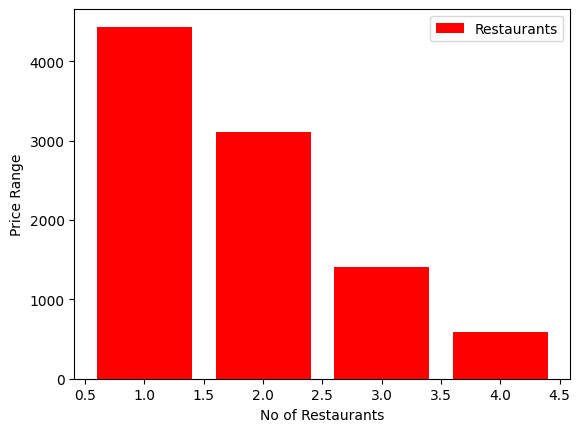

In [27]:
plt.bar(range.index,range.iloc,color='red',label='Restaurants')
plt.xlabel('No of Restaurants')
plt.ylabel('Price Range')
plt.legend()
plt.show()

In [28]:
total_count_range = df2['Price range'].value_counts().sum()
print("Percentage of restaurants with Price range", range.index[0], ":", round(range.values[0]/total_count_range * 100,2), "%")
print("Percentage of restaurants with Price range", range.index[1], ":", round(range.values[1]/total_count_range * 100,2), "%")
print("Percentage of restaurants with Price range", range.index[2], ":", round(range.values[2]/total_count_range * 100,2), "%")
print("Percentage of restaurants with Price range", range.index[3], ":", round(range.values[3]/total_count_range * 100,2), "%")

Percentage of restaurants with Price range 1.0 : 46.51 %
Percentage of restaurants with Price range 2.0 : 32.62 %
Percentage of restaurants with Price range 3.0 : 14.72 %
Percentage of restaurants with Price range 4.0 : 6.14 %


### Task 4 : Online Delivery

In [29]:
online_del = df2['Has Online delivery'].value_counts()
online_del

Has Online delivery
No     7091
Yes    2451
Name: count, dtype: int64

In [30]:
online_del_sum = online_del.sum()
print("Percentage of restaurants that has Online delivery :", round(online_del.values[1]/online_del_sum * 100, 2), "%")

Percentage of restaurants that has Online delivery : 25.69 %
